In [2]:
import copy
import os
from typing import Any

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import polars as pl
import pyref.fitting as fit
from matplotlib.figure import Figure
from refnx.analysis import Transform

CPU_COUNT = os.cpu_count() | 8
CPU_COUNT

40

Dataset loaded from /home/hduva/projects/xrr_notebooks/fitting/reflectivity_data.parquet


(<Axes: ylabel='$R$'>, <Axes: xlabel='$q (\\AA^{-1})$'>)

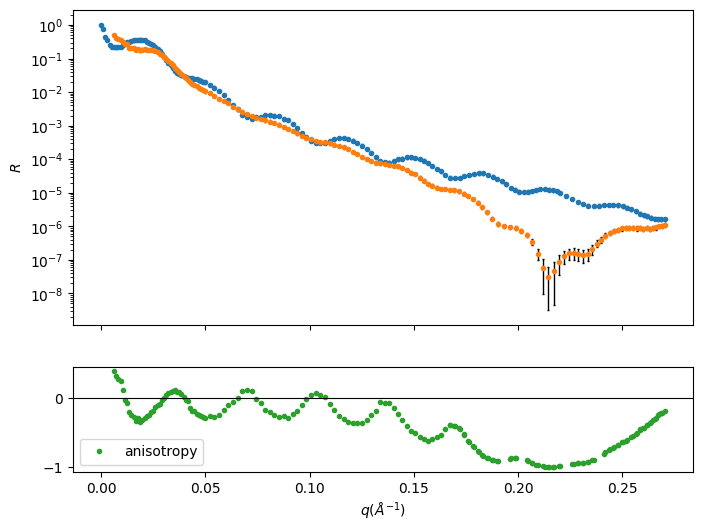

In [3]:
from pathlib import Path


def load_reflectivity_dataset(filename):
    """
    Load reflectivity dataset from a parquet file.

    Parameters
    ----------
    filename : str
        Input filename (should be a .parquet file)

    Returns
    -------
    dict
        Dictionary containing XrayReflectDataset objects with energy keys
    """
    # Load the DataFrame
    df_load = pl.read_parquet(filename)

    # Reconstruct the data dictionary
    data_reconstructed = {}

    # Group by energy
    for group_key, group_data in df_load.group_by("energy"):
        energy_val = group_key[0]  # Extract energy value from the group key tuple
        #  If the R - dR is negative or zero, drop the point
        diff = group_data["R"] - group_data["dR"]
        mask = diff > 0
        group_data = group_data.filter(mask)

        # Extract arrays
        Q = group_data["Q"].to_numpy()
        R = group_data["R"].to_numpy()
        dR = group_data["dR"].to_numpy()

        # Create XrayReflectDataset
        dataset = fit.XrayReflectDataset(data=(Q, R, dR))
        data_reconstructed[str(energy_val)] = dataset

    print(f"Dataset loaded from {filename}")
    return data_reconstructed


loaded_data = load_reflectivity_dataset(
    "/home/hduva/projects/xrr_notebooks/fitting/reflectivity_data.parquet"
)
loaded_data["283.7"].plot(label="283.7 eV data")

In [4]:
import pickle

with open("fitting/fitting_results_fixed_3.pkl", "rb") as f:
    fitting_results = pickle.load(f)

In [5]:
def select(global_objective, slab, energy):
    for o in global_objective.objectives:
        if o.model.energy == energy:
            for s in o.model.structure.components:
                if s.name.startswith(slab):
                    return s
            raise ValueError(f"No slab {slab} found in energy {energy}")
    raise ValueError(f"No energy {energy} found in global objective")


select(fitting_results, "Surface", 283.7).thick.setp(bounds=(0, 35))
select(fitting_results, "Surface", 283.7).rough.setp(bounds=(0, 25))
select(fitting_results, "Surface", 283.7).sld.rotation.setp(bounds=(0, np.pi / 2))
select(fitting_results, "Surface", 283.7).sld.density.setp(bounds=(0.5, 2))

select(fitting_results, "ZnPc", 283.7).thick.setp(bounds=(160, 200))
select(fitting_results, "ZnPc", 283.7).rough.setp(bounds=(0, 25))
select(fitting_results, "ZnPc", 283.7).sld.rotation.setp(
    bounds=(np.deg2rad(55), np.deg2rad(90))
)

select(fitting_results, "Contamination", 283.7).thick.setp(bounds=(0, 35))
select(fitting_results, "Contamination", 283.7).rough.setp(bounds=(0, 25))
select(fitting_results, "Contamination", 283.7).sld.rotation.setp(bounds=(0, np.pi / 2))
select(fitting_results, "Contamination", 283.7).sld.density.setp(bounds=(0.5, 2))

select(fitting_results, "Oxide", 283.7).thick.setp(bounds=(0, 20))
select(fitting_results, "Oxide", 283.7).rough.setp(bounds=(0, 25))

In [6]:
#  Grab all the scale's and offsets and change their bounds
for p in fitting_results.varying_parameters():
    if p.name in ["scale_s", "scale_p"]:
        p.setp(bounds=(0.5, 2))

# Grab the energy offset and set it to change
for o in fitting_results.objectives:
    if o.model.energy == 283.7:
        o.model.energy_offset.setp(vary=True, bounds=(-1, 1))

In [7]:
def x0(fitter, use_old=False):
    o = fitter.objective
    p0 = o.varying_parameters()
    # Look in dft_internal_de.txt for the best x0
    if use_old and Path("fitting/dft_internal_de.txt").exists():
        x0 = np.loadtxt("fitting/dft_internal_de.txt")
        return x0
    return np.array([o.value for o in p0])


def bounds(p, override_chain=False, x0=None):
    # If x0 is provided use that instead of the value.
    value = p.value if x0 is None else x0
    width = (p.bounds.ub - p.bounds.lb) / 2
    lower = value - width
    upper = value + width

    # Ensure the current parameter value is within the bounds
    lower = min(lower, value)
    upper = max(upper, value)
    lower *= 0.1 if value > 0 else 5
    upper *= 5 if value > 0 else 0.1
    return (lower, upper)


def update_bounds(fitter, override_chain=False, use_old=False):
    p0 = fitter.objective.varying_parameters()
    x_0 = x0(fitter, use_old) if use_old else [None for _ in p0]
    for i, p in enumerate(p0):
        if p.name.split("_")[-1] in ["rotation", "offset"]:
            continue
        # Update the bounds
        p.setp(
            bounds=bounds(
                p,
                override_chain,
                x_0[i],
            )
        )

In [8]:
import emcee
import numpy as np
from refnx._lib.emcee.moves import DEMove, DESnookerMove, StretchMove

de: list[
    tuple[DEMove, float] | tuple[DESnookerMove, float] | tuple[StretchMove, float]
] = [
    (DEMove(), 0.4),
    (StretchMove(), 0.2),
    (DESnookerMove(), 0.25),
    (DESnookerMove(gammas=10), 0.15),
]

In [9]:
from pathlib import Path

import emcee
import numpy as np
from refnx import analysis as fit
from refnx.analysis import process_chain

# Let's construct an internal optimization for selected energies
internal_energies = [250.0, 283.7, 284.2, 285.1, 287.0, 289.0]
internal_objectives = [
    o for o in fitting_results.objectives if o.model.energy in internal_energies
]

# Construct a global objective from the internal objectives
global_objective = fit.GlobalObjective(internal_objectives)

# Define checkpoint path
checkpoint_path = Path.cwd() / "fitting" / "dft_internal.h5"


def create_fitter_with_backend(
    objective: fit.GlobalObjective,
    checkpoint_path: Path,
    group_name: str = "initial",
    nwalkers: int = 200,
    reset: bool = False,
    **mcmc_kws,
) -> fit.CurveFitter:
    """
    Create a CurveFitter with an HDFBackend for checkpointing.

    Parameters
    ----------
    objective : GlobalObjective or Objective
        The objective to fit.
    checkpoint_path : Path
        Path to the HDF5 checkpoint file.
    group_name : str
        Name of the group within the HDF5 file to store this chain.
    nwalkers : int
        Number of walkers for the ensemble sampler.
    reset : bool
        If True, reset the backend and start fresh. If False, continue
        from existing chain if available.
    **mcmc_kws
        Additional keyword arguments passed to CurveFitter (e.g., moves).

    Returns
    -------
    fitter : CurveFitter
        The configured CurveFitter object.
    """
    ndim = len(objective.varying_parameters())

    # Create the backend
    backend = emcee.backends.HDFBackend(str(checkpoint_path), name=group_name)

    # Check if we need to reset or if the file doesn't exist
    if reset or not checkpoint_path.exists():
        # Reset the backend for a fresh start
        backend.reset(nwalkers, ndim)
        print(
            f"Backend reset. Starting fresh with {nwalkers} walkers, {ndim} dimensions."
        )
    else:
        # Check if the backend has existing data
        try:
            existing_iterations = backend.iteration
            print(f"Found existing chain with {existing_iterations} iterations.")
        except (KeyError, AttributeError):
            # No existing data, need to reset
            backend.reset(nwalkers, ndim)
            print("No existing chain found. Starting fresh.")

    # Create the fitter with the backend
    fitter = fit.CurveFitter(
        objective,
        nwalkers=nwalkers,
        backend=backend,
        **mcmc_kws,
    )
    # Update the objective's parameters with the chain
    if not reset:
        for i, p in enumerate(fitter.objective.varying_parameters()):
            p.chain = fitter.chain[:, 0, i]

    return fitter


def sample_with_checkpoint(
    fitter: fit.CurveFitter,
    nsteps: int,
    nthin: int = 1,
    pool: int = -1,
    random_state: int | None = None,
    continue_from_checkpoint: bool = True,
) -> None:
    """
    Run MCMC sampling with checkpointing support.

    Parameters
    ----------
    fitter : CurveFitter
        The CurveFitter object with an HDFBackend.
    nsteps : int
        Number of steps to sample.
    nthin : int
        Thinning factor - save every nthin steps.
    pool : int
        Number of parallel processes. -1 uses all available CPUs.
    random_state : int, optional
        Random seed for reproducibility.
    continue_from_checkpoint : bool
        If True and a checkpoint exists, continue from the last state.
        If False, initialize walkers fresh (but keeps existing chain data).
    """
    backend = fitter._sampler.backend  # type: ignore

    # Check if we have existing samples and should continue
    if continue_from_checkpoint and backend.iteration > 0:
        print(f"Continuing from iteration {backend.iteration}")
        # When continuing, we don't need to initialize - pass None to sample
        # The sampler will use the last state from the backend
        fitter.sample(
            nsteps,
            nthin=nthin,
            pool=pool,
            random_state=random_state,
        )
    else:
        # Initialize walkers for a fresh start
        print("Initializing walkers with 'jitter' method")
        fitter.initialise("jitter", random_state=random_state or 12345)
        fitter.sample(
            nsteps,
            nthin=nthin,
            pool=pool,
            random_state=random_state,
        )

    print(f"Sampling complete. Total iterations: {backend.iteration}")


def get_full_chain_history(fitter: fit.CurveFitter, discard: int = 0, thin: int = 1):
    """
    Retrieve the full chain history from the backend.

    Parameters
    ----------
    fitter : CurveFitter
        The CurveFitter object with an HDFBackend.
    discard : int
        Number of initial steps to discard (burn-in).
    thin : int
        Thinning factor for the returned chain.

    Returns
    -------
    chain : ndarray
        Chain with shape (nsteps, nwalkers, ndim).
    log_prob : ndarray
        Log probability with shape (nsteps, nwalkers).
    """
    backend = fitter._sampler.backend  # type: ignore

    chain = backend.get_chain(discard=discard, thin=thin)
    log_prob = backend.get_log_prob(discard=discard, thin=thin)

    return chain, log_prob


In [10]:
fitter = create_fitter_with_backend(
    global_objective,
    checkpoint_path,
    reset=True,
    moves=de,
)

fitter.initialise("jitter", random_state=12345)
fitter.sample(1000)

Backend reset. Starting fresh with 200 walkers, 41 dimensions.


100%|██████████| 1000/1000 [50:44<00:00,  3.04s/it]


[MCMCResult(name='scale_s', param=Parameter(value=1.034010626570082, name='scale_s', vary=True, bounds=Interval(lb=0.5, ub=2.0), constraint=None), stderr=0.1021093408112193, chain=array([[0.86766705, 0.86766183, 0.86775333, ..., 0.86772706, 0.86764205,
         0.86764153],
        [0.86766276, 0.86766135, 0.86775333, ..., 0.86772757, 0.86764363,
         0.86764178],
        [0.86766049, 0.86755841, 0.86778994, ..., 0.8677573 , 0.86767918,
         0.86759845],
        ...,
        [1.10181025, 1.11441719, 1.09668922, ..., 1.10981669, 1.11292419,
         1.1241823 ],
        [1.10181025, 1.11441719, 1.09668922, ..., 1.10981669, 1.11292419,
         1.1241823 ],
        [1.10181025, 1.11441719, 1.09843356, ..., 1.10981669, 1.11292419,
         1.12464108]], shape=(1000, 200)), median=np.float64(1.034010626570082)),
 MCMCResult(name='scale_p', param=Parameter(value=1.2267726435762272, name='scale_p', vary=True, bounds=Interval(lb=0.5, ub=2.0), constraint=None), stderr=0.109024715563328

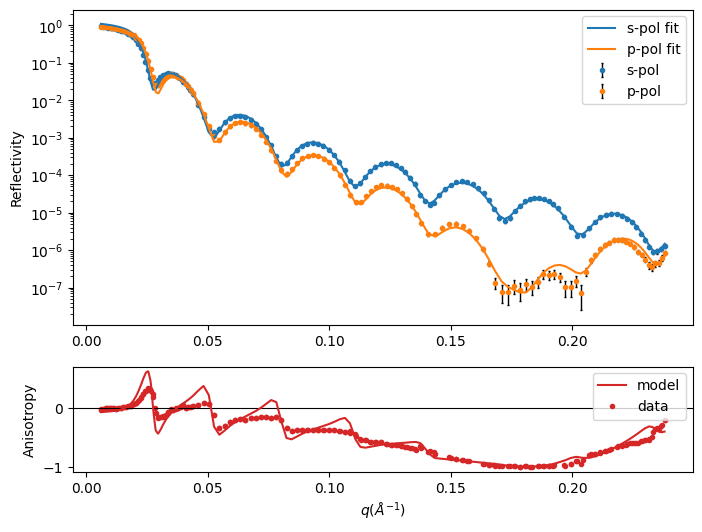

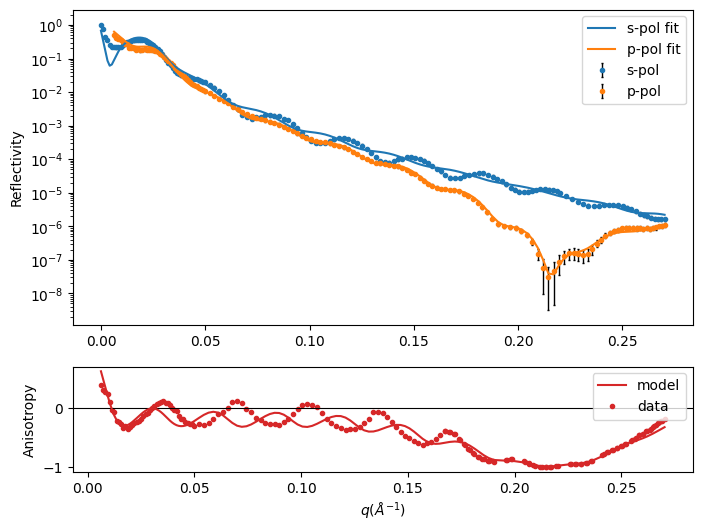

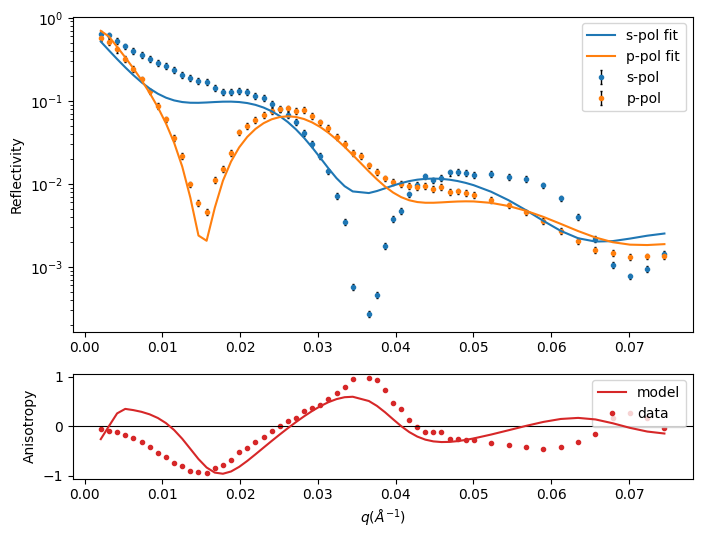

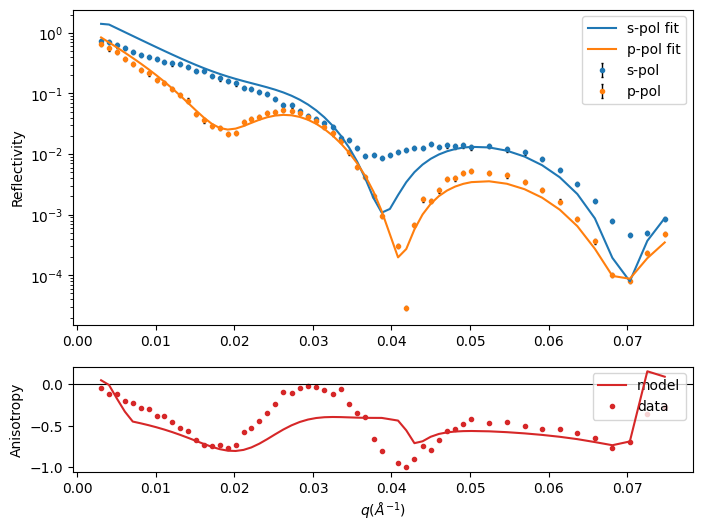

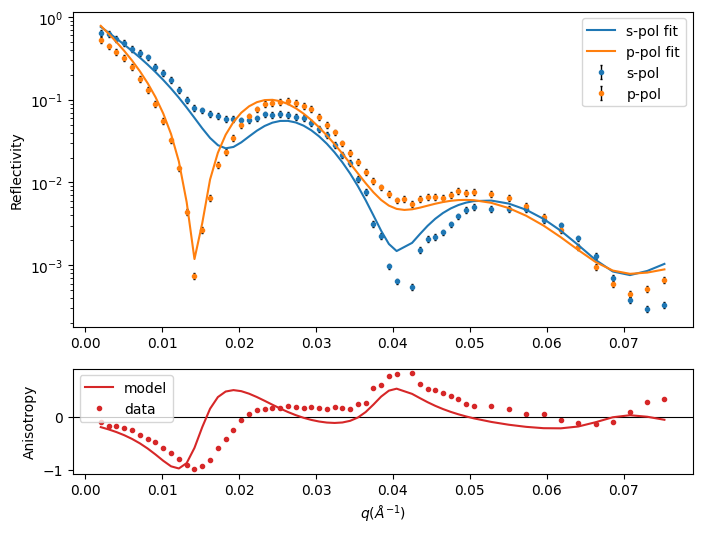

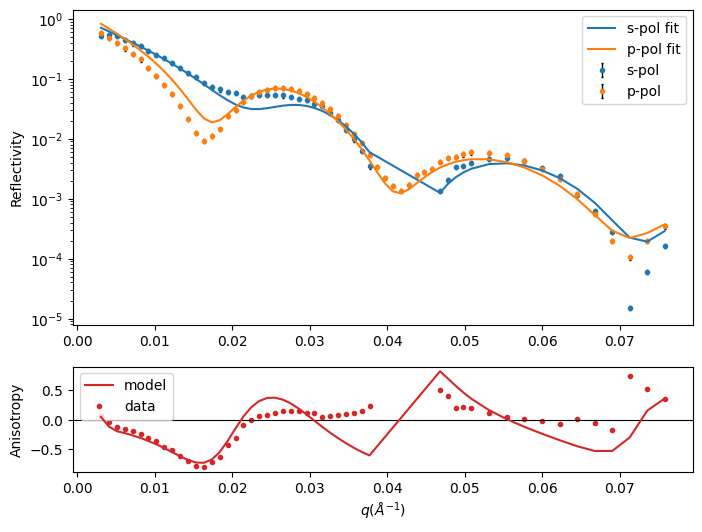

In [11]:
for o in global_objective.objectives:
    o.plot()
    plt.show()

In [12]:
from pathlib import Path

import numpy as np


# Define the callback for DE optimization
def save_de_best_x0(x0, *args, **kwargs):
    """
    Callback to save the current best candidate x[0] to a checkpoint file
    during differential evolution as used by refnx.

    Parameters
    ----------
    intermediate_result : OptimizeResult
        The intermediate result from the differential evolution.
    *args, **kwargs : Ignored
        Additional arguments to be compatible with scipy/refnx callback signatures.
    """
    best_x0 = x0
    checkpoint = Path.cwd() / "fitting" / "dft_internal_de.txt"
    np.savetxt(str(checkpoint), best_x0.reshape(1, -1))  # save as single row


update_bounds(fitter, override_chain=False, use_old=False)

# Use the callback during DE fit
fitter.fit(
    "differential_evolution",
    workers=CPU_COUNT - 10,
    updating="deferred",
    maxiter=10,  # We are reusing the old x0 so this is really just to check things
    x0=x0(fitter, use_old=True),
    callback=save_de_best_x0,
)
update_bounds(fitter, override_chain=True)

0it [00:00, ?it/s]


ValueError: Some entries in x0 lay outside the specified bounds

In [12]:
fitter_refined = create_fitter_with_backend(
    global_objective,
    checkpoint_path,
    group_name="refined",
    reset=True,
    moves=de,
    nwalkers=len(global_objective.varying_parameters()) * 25,
)

Backend reset. Starting fresh with 1025 walkers, 41 dimensions.


In [13]:
fitter_refined.initialise("jitter", random_state=12345)
fitter_refined.sample(50)
# compute the autocorrelation time and then reset the sampler and sample again for 100 * act
act = fitter_refined.sampler.get_autocorr_time(quiet=True).max()
act = int(act) if not np.isnan(act) else 5
_ = fitter_refined.sample(100 * act)


100%|██████████| 50/50 [05:17<00:00,  6.34s/it]
The chain is shorter than 50 times the integrated autocorrelation time for 41 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 1;
tau: [5.47098028 5.45816934 5.61318053 5.55948641 5.3160144  5.52990738
 5.31151666 5.57851759 5.5413494  4.79447588 5.61246032 5.22651843
 4.89449099 5.71512813 5.51007359 5.52708851 5.3865089  5.57401406
 5.52161509 5.47705591 5.4007255  5.42947301 5.41266279 5.45440462
 5.50040262 5.51524759 5.53697566 5.49578117 5.3399274  5.67072329
 5.58789713 5.51207211 5.54386673 5.58958286 5.61810591 5.59199894
 5.49329086 5.49516805 5.41379448 5.47397817 5.47501395]
 16%|█▌        | 79/500 [06:23<29:43,  4.24s/it]/home/hduva/projects/xrr_notebooks/.venv/lib/python3.12/site-packages/refnx/util/ErrorProp.py:87: RuntimeWarning: invalid value encountered in log10
  return n * np.log10(k * a), np.absolute(n * da / (a * np.log(10)))
/home/hduva/projects/xrr_notebooks/.venv/lib/python3.12/site-pack

emcee: Exception while calling your likelihood function:
  params: [ 8.35865115e-01  7.41612334e-01 -1.27519648e-01  6.15085071e-01
  7.55725512e-01  1.56466875e+01  7.72935328e-02  4.02038804e-01
  1.44310118e+00  1.79273650e+02  4.76206731e+00  2.11561834e+00
  1.20932419e+00  1.98530307e+01  6.59450323e+00  1.82381482e+00
  1.01892142e+00  6.89963915e+00  7.08203509e+00  2.83618650e+00
  2.73477274e+00  1.28845824e+00  7.69700257e-01 -9.90273979e-02
  1.10196979e-01 -3.45724915e-01  1.38416112e+00 -1.26002412e-01
  9.99886416e-02  1.30343807e+00  2.27838872e-01 -6.22036740e-02
  6.28391199e-01 -2.12839060e-03  6.84845842e-01  2.35981560e-01
  4.10551520e-01  1.10848631e+00  1.28124042e+00  2.10398212e-01
  3.06877999e-01]
  args: []
  kwargs: {}
  exception:


Traceback (most recent call last):
  File "/home/hduva/projects/xrr_notebooks/.venv/lib/python3.12/site-packages/refnx/_lib/emcee/ensemble.py", line 624, in __call__
    return self.f(x, *self.args, **self.kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/hduva/projects/xrr_notebooks/.venv/lib/python3.12/site-packages/refnx/analysis/objective.py", line 744, in logpost
    logpost += self.logl()
               ^^^^^^^^^^^
  File "/home/hduva/projects/xrr_notebooks/.venv/lib/python3.12/site-packages/refnx/analysis/objective.py", line 1222, in logl
    logl += _lambda * objective.logl()
                      ^^^^^^^^^^^^^^^^
  File "/home/hduva/projects/xrr_notebooks/.venv/lib/python3.12/site-packages/pyref/fitting/fitters.py", line 95, in logl
    ll = super().logl(pvals=pvals)
         ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/hduva/projects/xrr_notebooks/.venv/lib/python3.12/site-packages/refnx/analysis/objective.py", line 682, in logl
    raise RuntimeError("Objectiv

RuntimeError: Objective.logl encountered a NaN.

The chain is shorter than 50 times the integrated autocorrelation time for 41 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 1;
tau: [5.58309727 5.50777115 5.58849693 5.56873202 5.65473413 5.74804064
 5.51163171 5.55522368 5.43320305 5.08823646 5.73010059 5.24702251
 5.0983539  5.49756249 5.60422336 5.47342441 5.50356263 5.6129181
 5.3357898  5.52647142 5.25899443 5.51226735 5.47204095 5.5913965
 5.37787158 5.49797524 5.41822193 5.64808982 5.49276289 5.58997004
 5.60223266 5.47132742 5.67954902 5.52040914 5.40104221 5.61650563
 5.59809809 5.34070029 5.71670755 5.52288804 5.48914863]


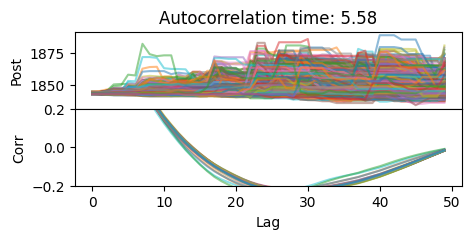

In [ ]:
fig, axs = plt.subplots(nrows=2, figsize=(5, 2), sharex=True, gridspec_kw={"hspace": 0})
axs[0].plot(-fitter_refined.logpost, alpha=0.5)
axs[0].set_ylabel("Post")
axs[0].set_xlabel("Step")
axs[1].plot(fitter_refined.acf(), alpha=0.5)
axs[1].set_ylabel("Corr")
axs[1].set_xlabel("Lag")
axs[1].set_ylim(-0.2, 0.2)
axs[0].set_title(
    f"Autocorrelation time: {fitter_refined.sampler.get_autocorr_time(quiet=True)[0]:.2f}"
)
plt.show()

In [42]:
import arviz as az

reader = emcee.backends.HDFBackend(str(checkpoint_path), name="refined")
idata = az.from_emcee(
    sampler=reader, var_names=[p.name for p in global_objective.varying_parameters()]
)
az.summary(idata)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
scale_s,1.299,0.022,1.257,1.340,0.000,0.000,2827.0,6001.0,1.05
scale_p,0.902,0.020,0.864,0.942,0.000,0.000,2260.0,3415.0,1.06
energy_offset,-0.102,0.007,-0.112,-0.087,0.000,0.000,1457.0,2679.0,1.09
theta_offset_s,0.110,0.024,0.074,0.168,0.001,0.000,1565.0,3125.0,1.08
theta_offset_p,0.321,0.013,0.297,0.346,0.000,0.000,3104.0,6558.0,1.05
Surface_283.7_thick,13.004,0.131,12.751,13.250,0.002,0.001,3907.0,8396.0,1.04
Surface_283.7_rough,0.310,0.408,-0.379,1.038,0.007,0.007,3652.0,3680.0,1.06
Surface_283.7_density,0.529,0.020,0.493,0.568,0.000,0.000,2054.0,7949.0,1.06
Surface_283.7_rotation,1.554,0.012,1.533,1.571,0.000,0.000,3954.0,4953.0,1.05
ZnPc_283.7_thick,185.364,0.601,184.063,186.387,0.013,0.016,2195.0,2983.0,1.06


/home/hduva/projects/xrr_notebooks/.venv/lib/python3.12/site-packages/arviz/plots/traceplot.py:223: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (21), generating only 20 plots
  warnings.warn(


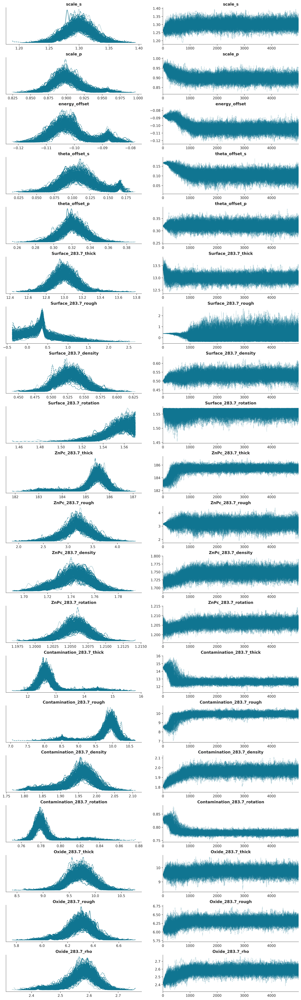

In [44]:
az.style.use("arviz-doc")
az.plot_trace(idata)
plt.show()


In [37]:
fitter_final = create_fitter_with_backend(
    global_objective,
    checkpoint_path,
    group_name="final",
    reset=True,
    moves=de,
)
fitter_final.initialise_with_chain(fitter_refined.sampler.get_chain())

Backend reset. Starting fresh with 200 walkers, 41 dimensions.


Found existing chain with 1000 iterations.


The chain is shorter than 50 times the integrated autocorrelation time for 30 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 20;
tau: [79.98861805 75.49452172         nan         nan         nan 76.49322872
 75.89080968 77.44645555 76.96683088 74.48297739 76.6743989  75.51121919
         nan 76.4336779          nan         nan 76.08747207         nan
         nan 74.83520614 77.98469911 73.32777765         nan 71.91258838
 73.17854848 77.5831931  76.99938471 75.33436127 74.93909753 72.79342912
 71.98736548 77.76077561 77.96301981         nan 75.82320449 76.7790228
         nan 70.31032262 75.51562327 75.98037536 74.02704856]


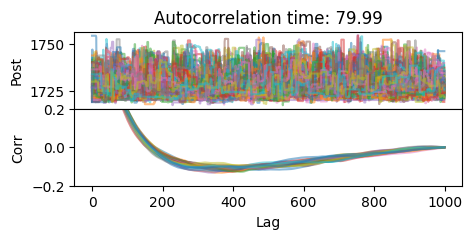

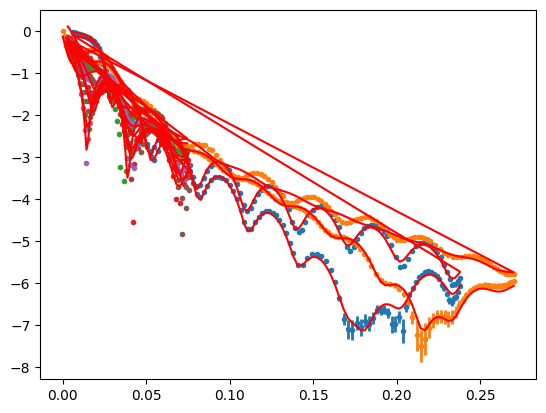

AssertionError: I don't believe that you want more dimensions than samples!

In [19]:
fitter_final.objective.plot()
plt.show()
fitter_final.objective.corner()
plt.show()

In [ ]:
with open("fitting_results_fixed_4.pkl", "wb") as f:
    pickle.dump(fitting_results, f)

In [ ]:
# Fix the energy offset term and link in the other energies
for o in global_objective.objectives:
    if o.model.energy == 283.7:
        o.model.energy_offset.setp(vary=False)


external_objectives = [
    o for o in global_objective.objectives if o.model.energy not in internal_energies
].extend(internal_objectives)
total_objective = fit.GlobalObjective(external_objectives)
print(total_objective.varying_parameters())